# Animal disease classification problem with Image Recognition and symptoms

In [1]:
#importing libraries
import sklearn
import seaborn as sea
import matplotlib.pyplot as mat
import tensorflow as tf
import scipy
import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.metrics.classification import accuracy_score, log_loss
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
import math
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as mat
warnings.filterwarnings("ignore")
from scipy.linalg import eigh 
from sklearn.linear_model import LogisticRegression
import tensorflow as tf
from keras.preprocessing import image
from scipy import pi
import warnings
from tensorflow.core.protobuf import saver_pb2
import cv2
from subprocess import call
import math
warnings.filterwarnings("ignore")
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten,BatchNormalization,Activation
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K
import model
import os
from pandas.tools.plotting import table
from PIL import Image
import pylab

Using TensorFlow backend.


In [2]:
#storage of images
#converting the png images to jpeg
disease=['pox','calf_scour','rinderpest','anthrax','black_leg','masstitiess','ringworm','blue_tongue','rabbies','foot and mouth','brucellosis','Coccidiosis','johnes diesease']
count=0
for x in disease:
    for y in os.listdir('Desktop/'+x): 
        if y.find('.')!=0:
            im = Image.open('Desktop/'+x+'/'+y)
            rgb_im = im.convert('RGB')
            rgb_im.save('Desktop/'+x+'/'+y.replace('png','jpg'))
            count=count+1
print 'the total number of images we have is',count
#converting images to vectors of 224*224*3
train_img_x=[]
class_labels_y=[]
for x in disease:
    for y in os.listdir('Desktop/'+x): 
        if y.find('.')!=0:
            train_img_x.append(scipy.misc.imresize(scipy.misc.imread('Desktop/'+x+'/'+y), [230, 230]))
            class_labels_y.append(disease.index(x))

the total number of images we have is 66


In [3]:
session=tf.InteractiveSession()
pad_top=3
pad_left=3
pad_bottom=3
height=100
width=1
pad_right=3
crop_size=[150,250]
x=tf.placeholder(dtype=tf.float32,shape=(230,230,3))
flip_2 = tf.image.flip_up_down(x)
flip_3 = tf.image.flip_left_right(x)
flip_4 = tf.image.random_flip_up_down(x)
flip_5 = tf.image.random_flip_left_right(x)
image_resise=tf.contrib.image.rotate(x,6)
rot_90 = tf.image.rot90(x, k=1)
rot_180 = tf.image.rot90(x, k=2)
rot_tf = tf.contrib.image.rotate(x, angles=3.1444)
seed = np.random.randint(10000003,12344888999)
noise = tf.random_normal(shape=tf.shape(x), mean=20.0, stddev=30.0,
dtype=tf.float32)
output_noise = tf.add(x, noise)
image = tf.image.resize_image_with_crop_or_pad(x,200+100, 300+100)
distorted_image = tf.random_crop(image,[230, 230,3])

Instructions for updating:
Use the retry module or similar alternatives.


In [4]:
#agumented images from the tensorgraph
final_train_img=[]
final_train_y=[]
for i,y in enumerate(train_img_x):
    final_train_img.append(y)
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array(session.run(flip_2,feed_dict={x:y.astype(np.float32)})))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array((session.run(flip_3,feed_dict={x:y.astype(np.float32)}))))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array(session.run(flip_4,feed_dict={x:y.astype(np.float32)})))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array(session.run(flip_5,feed_dict={x:y.astype(np.float32)})))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array(session.run(image_resise,feed_dict={x:y.astype(np.float32)})))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array((session.run(rot_180,feed_dict={x:y.astype(np.float32)}))))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array((session.run(rot_tf,feed_dict={x:y.astype(np.float32)}))))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array(session.run(output_noise,feed_dict={x:y.astype(np.float32)})))
    final_train_y.append(class_labels_y[i])
    final_train_img.append(np.array((session.run(distorted_image,feed_dict={x:y.astype(np.float32)}))))
    final_train_y.append(class_labels_y[i])

In [5]:
pylab.savefig('animal_disease_data_barplot.jpeg')

The number of points in  pox 40
The number of points in  calf_scour 40
The number of points in  rinderpest 40
The number of points in  anthrax 70
The number of points in  black_leg 40
The number of points in  masstitiess 80
The number of points in  ringworm 90
The number of points in  blue_tongue 40
The number of points in  rabbies 40
The number of points in  foot and mouth 60
The number of points in  brucellosis 40
The number of points in  Coccidiosis 30
The number of points in  johnes diesease 50


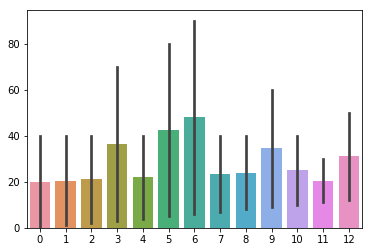

In [6]:
#distributions of data points among the thirteen classes
import pylab
count_each_class={}
for i in range(0,13):
    count_each_class[i]=sum(np.array(final_train_y)==i)
(sea.barplot(data=count_each_class.items()))
mat.xlabel
pylab.savefig('animal_disease_data_barplot.jpeg')
for x,y in count_each_class.items():
    print 'The number of points in ',disease[x],y

In [6]:
#scaling the images and preparing the dataset that should be fed to our model
final_y_train_img=[]
final_temp_train=[]
for i,x in enumerate(final_train_img):
    final_train_img[i]=final_train_img[i]/255.0
    for u in range(0,13):
        if final_train_y[i]==u:
            final_temp_train.append(1)
        else:
            final_temp_train.append(0)
    final_y_train_img.append(final_temp_train)
    final_temp_train=[]

In [7]:
final_train_img_for_smot=np.array(final_train_img).reshape(660,230*230*3)
y_train=np.array(final_train_y)
from imblearn.over_sampling import SMOTE
for i in range(0,13):
    print 'The number of points in class ',i,' is ',sum(np.array(final_train_y)==i)
sm=SMOTE(random_state=2)
x_train,y_train=sm.fit_sample(final_train_img_for_smot,np.array(final_train_y))
for i in range(0,13):
    print 'The number of points in class ',i,' is ',sum(np.array(y_train)==i)
final_train_img=x_train.reshape(1170,230,230,3)
final_train_y=y_train

The number of points in class  0  is  40
The number of points in class  1  is  40
The number of points in class  2  is  40
The number of points in class  3  is  70
The number of points in class  4  is  40
The number of points in class  5  is  80
The number of points in class  6  is  90
The number of points in class  7  is  40
The number of points in class  8  is  40
The number of points in class  9  is  60
The number of points in class  10  is  40
The number of points in class  11  is  30
The number of points in class  12  is  50
The number of points in class  0  is  90
The number of points in class  1  is  90
The number of points in class  2  is  90
The number of points in class  3  is  90
The number of points in class  4  is  90
The number of points in class  5  is  90
The number of points in class  6  is  90
The number of points in class  7  is  90
The number of points in class  8  is  90
The number of points in class  9  is  90
The number of points in class  10  is  90
The number o

In [41]:
final_train_y

array([ 0,  0,  0, ..., 12, 12, 12])

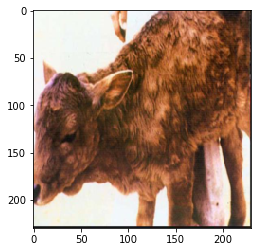

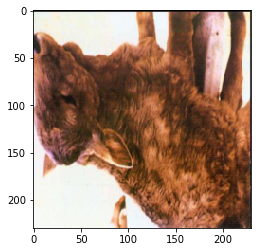

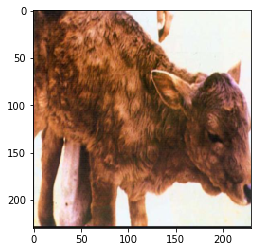

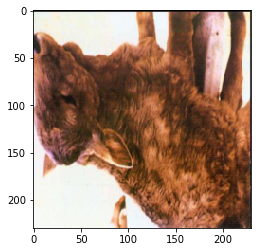

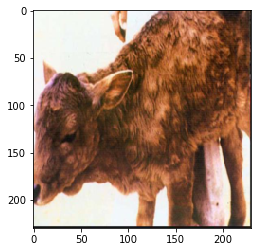

...

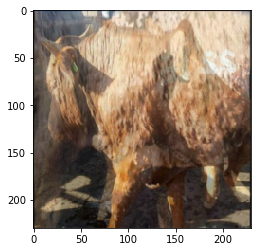

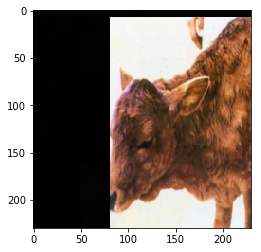

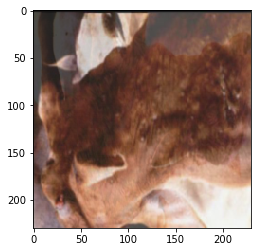

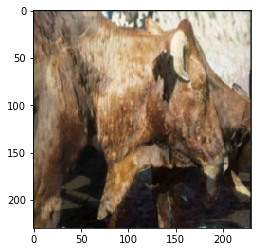

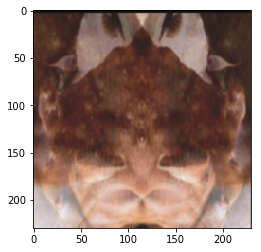

In [42]:
for i,x in enumerate(final_train_y):
    if x==2:
        mat.imshow(Image.fromarray((final_train_img[i]*255.0).astype('uint8')))
        mat.show()

In [43]:
#reading the symptoms.txt file
symtoms_diesease={}
unique_symtoms_2_numbers={}
unique_numbers_2_symptoms={}
symtoms=open('Downloads/Symptoms.txt')
for x in symtoms.readlines()[1:]:
    if x!='\n':
         symtoms_diesease[x.split('-')[0].split(' ')[1]]=  x.split('-')[1:][0].replace(" ","").replace(".\n","").replace(".","").split(',')
counter=0
for x,y in symtoms_diesease.items():
    for i in y:
        if i not in unique_symtoms_2_numbers.keys():
            unique_symtoms_2_numbers[i]=counter
            counter=counter+1
        else:
            pass
unique_numbers_2_symptoms={y:x for x,y in unique_symtoms_2_numbers.items()}

In [44]:
#combitorial text analytics
from itertools import combinations
def combinatrics(x,array_of_symptoms):
    symptoms_particular_entity=[]
    for i in range(3,len(array_of_symptoms)+1):
        for x in combinations(array_of_symptoms,r=i):
            symptoms_particular_entity.append(list(x))
    return symptoms_particular_entity
symtoms_diesease_combinations={}
for x in symtoms_diesease.keys():
        symtoms_diesease_combinations[x]=combinatrics(x,symtoms_diesease[x])

In [45]:
final_train_img[0].shape

(230, 230, 3)

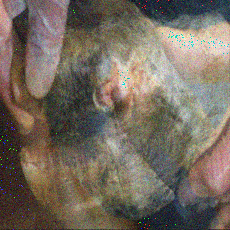

In [46]:
Image.fromarray((final_train_img[1000]*255.0).astype('uint8'))

In [47]:
disease[final_train_y[1000]]

'foot and mouth'

In [48]:
#combinatrics random assosiation with the images
disease=['pox','Calfscour','Rinderpest','anthrax','Blackleg','Mastitis','Ringworm','Bluetongue','rabbies','FoodandMouthdisease','Brucellosis','Coccidiosis',"Johne'sdisease"]
final_text_part=[]
for i,x in enumerate(disease):
    j_counter=0
    counter_len=len(symtoms_diesease_combinations[x])-1
    for j in range(0,sum(np.array(final_train_y)==i)):
        if j_counter>counter_len:
            k=np.random.randint(0,counter_len)
            final_text_part.append(symtoms_diesease_combinations[x][k])
        else:
            final_text_part.append(symtoms_diesease_combinations[x][j_counter])
            j_counter=j_counter+1    

In [49]:
#converting the text to unique numbers
def final_array_to_numbers(obtained_array):
    final_array_text_temp_numbers=[]
    final_array_number=[]
    for i in obtained_array:
        for k in i:
              final_array_text_temp_numbers.append(unique_symtoms_2_numbers[k])
        final_array_number.append(final_array_text_temp_numbers)
        final_array_text_temp_numbers=[]
    return final_array_number
final_array_to_numbers_train=final_array_to_numbers(final_text_part)

In [50]:
#number to vector dimmensional
def numbers_vector_to_real_binary_array_vector(number_vector):
    return_binary_vector=np.zeros((1170,len(unique_symtoms_2_numbers)))
    for o,x in enumerate(number_vector):
        for i in x:
            return_binary_vector[o][i]=1
    return return_binary_vector
final_text_vector=numbers_vector_to_real_binary_array_vector(final_array_to_numbers_train)
def number_vector_to_real_class_label_vector(number_vector):
    return_binary_vector=np.zeros((1170,13))
    for k,i in enumerate(number_vector):
        return_binary_vector[k][i]=1
    return return_binary_vector
final_class_label_vector=number_vector_to_real_class_label_vector(final_train_y)

In [51]:
#final preprocessing ends here
final_text_vector=final_text_vector.astype(np.int32)
final_class_label_vector=final_class_label_vector.astype(np.float32)
print 'Image vector shapes' ,np.array(final_train_img).shape
print 'Label shape ',np.array(final_class_label_vector).shape
print 'symtom vector shape',np.array(final_text_vector).shape

Image vector shapes (1170, 230, 230, 3)
Label shape  (1170, 13)
symtom vector shape (1170, 31)


In [52]:
#saving the vectors

final_text_vector=final_text_vector.astype(np.float32)

In [53]:
#shuffle the vectors
rng_state = np.random.get_state()
np.random.shuffle(final_train_img)
np.random.set_state(rng_state)
np.random.shuffle(final_class_label_vector)
np.random.set_state(rng_state)
np.random.shuffle(final_text_vector)

In [54]:
np.random.set_state(rng_state)
np.random.shuffle(final_train_y)

In [21]:
#image recognition architecture on cnn and textual mechanisms
tf.reset_default_graph()


In [5]:
def weight_variable(shape):
    initial = tf.random_normal(shape, stddev=0.1)
    return tf.Variable(initial)

In [6]:
def conv2d(x, W, stride):
    return tf.nn.conv2d(x, W, strides=[1, stride, stride, 1], padding='VALID')

In [7]:
def bias_variable(shape):
    initial = tf.constant(0.1, shape=shape)
    return tf.Variable(initial)

In [18]:
25*25*32

20000

In [9]:
tf.reset_default_graph()
x = tf.placeholder(tf.float32, shape=[None, 230, 230, 3])
y_ = tf.placeholder(tf.float32, shape=[None, 13])
#convolution1
W_conv1 = weight_variable([3, 3, 3, 16])
b_conv1 = bias_variable([16])

h_conv1 = (conv2d(x, W_conv1, 1) + b_conv1)
batch_normalisation=tf.layers.batch_normalization(h_conv1,axis=3)
batch_normalisation_after_applying_relu=tf.nn.relu(batch_normalisation)

#maxpooling1
max_pool_1=tf.nn.max_pool(batch_normalisation_after_applying_relu,ksize=[1,2,2,1],strides=[1,2,2,1],padding='VALID')

#second convolutional layer

W_conv2=weight_variable([3,3,16,16])
b_conv2=bias_variable([16])

h_conv2=(conv2d(max_pool_1,W_conv2,1)+b_conv2)
batch_normalisation2=tf.layers.batch_normalization(h_conv2,axis=3)
batch_normalisation2_after_applying_relu=tf.nn.relu(batch_normalisation2)

#maxpooling 2
max_pool_2=tf.nn.max_pool(batch_normalisation2_after_applying_relu,ksize=[1,2,2,1],strides=[1,2,2,1],padding='VALID')

#convolution 3
W_conv3=weight_variable([3,3,16,32])
b_conv3=bias_variable([32])

h_conv3=(conv2d(max_pool_2,W_conv3,1)+b_conv3)

batch_normalisation3=tf.layers.batch_normalization(h_conv3,axis=3)
batch_normalisation3_after_applying_relu=tf.nn.relu(batch_normalisation3)

#maxpooling 3
max_pool_3=tf.nn.max_pool(batch_normalisation3_after_applying_relu,ksize=[1,2,2,1],strides=[1,2,2,1],padding='VALID')

#convolution 4

W_conv4=weight_variable([3,3,32,32])
b_conv4=bias_variable([32])
h_conv4=(conv2d(max_pool_3,W_conv4,1)+b_conv4)

batch_normalisation4=tf.layers.batch_normalization(h_conv4,axis=3)
batch_normalisation4_after_applying_relu=tf.nn.relu(batch_normalisation4)
keep_prob_0=tf.placeholder(tf.float32)
drop_out_addition=tf.nn.dropout(batch_normalisation4_after_applying_relu,keep_prob=keep_prob_0)
#maxpooling 4

max_pool_4=tf.nn.max_pool(drop_out_addition,ksize=[1 ,2,2,1],strides=[1,2,2,1],padding='VALID')

max_pool_flatten=tf.reshape(max_pool_4,[-1,12*12*32])
keep_prob1=tf.placeholder(tf.float32)
w_fc_1=weight_variable([4608,512])
b_fc_1=weight_variable([512])

before_final_activation=tf.nn.relu(tf.matmul(max_pool_flatten,w_fc_1)+b_fc_1)
before_final_activation_drop_out=tf.nn.dropout(before_final_activation,keep_prob=keep_prob1)
w_fc_2=weight_variable([512,13])
b_fc_2=weight_variable([13])

final_activation_y=(tf.matmul(before_final_activation,w_fc_2)+b_fc_2)

In [30]:
session = tf.InteractiveSession()
L2NormConst = 0.001
train_vars = tf.trainable_variables()
loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=final_activation_y,labels=y_))

optimizer = tf.train.AdamOptimizer(1e-4).minimize(loss)
#Gradient Clipping
session.run(tf.global_variables_initializer())


In [ ]:
epochs = 30
batch_size = 200
less=100000
loss_iteration=[]
saver = tf.train.Saver(write_version = saver_pb2.SaverDef.V2)
# train over the dataset about 30 times
for epoch in range(600000):
    for i in range(510):
        optimizer.run(feed_dict={x:final_train_img[i:i+30], y_:final_class_label_vector[i:i+30],keep_prob1:0.2,keep_prob_0:0.5})
        if i % 10 == 0:
            loss_value = loss.eval(feed_dict={x:final_train_img[i:i+30], y_:final_class_label_vector[i:i+30],keep_prob1:0.2,keep_prob_0:0.5})
            print 'The number of epoch',epoch,'The loss is ',loss_value
            loss_iteration.append(loss_value)
            if loss_value<less:
                less=loss_value
                save_path = saver.save(session, "save/model_animal_disease.ckpt")

## final_deployment

In [2]:
model = Sequential()

# conv 1
model.add(Conv2D(16, (3,3), input_shape=(230,230,3)))
model.add(BatchNormalization(axis=3))
model.add(Activation('relu'))
#model.add(Dropout(0.5))

# max pool 1
model.add(MaxPooling2D(pool_size=(2,2),strides=2))         

# conv 2
model.add(Conv2D(16, (3,3)))                    
model.add(BatchNormalization(axis=3))
model.add(Activation('relu'))
#model.add(Dropout(0.5))

# max pool 2
model.add(MaxPooling2D(pool_size=(2,2),strides=2))       

# conv 3
model.add(Conv2D(32, (3,3)))                    
model.add(BatchNormalization(axis=3))
model.add(Activation('relu'))

# max pool 3
model.add(MaxPooling2D(pool_size=(2,2),strides=2))          

# conv 4
model.add(Conv2D(32, (3,3)))                     
model.add(BatchNormalization(axis=3))
model.add(Activation('relu'))
model.add(Dropout(0.7))
# max pool 4
model.add(MaxPooling2D(pool_size=(2,2),strides=2))  

# flatten
model.add(Flatten())


# fc layer 1
model.add(Dense(512, activation='relu'))

model.add(Dropout(0.2))



# fc layer 2
model.add(Dense(13, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [57]:
X_train_img=np.array(final_train_img)[:1000]
Y_train_img=np.array(final_class_label_vector)[:1000]
X_test_img=np.array(final_train_img)[1000:]
Y_test_img=np.array(final_class_label_vector)[1000:]

In [ ]:
model.fit(np.array(X_train_img),np.array(Y_train_img),
          batch_size=30,
          epochs=10000,
          verbose=1,
          validation_data=(np.array(X_test_img),np.array(Y_test_img)))

In [388]:
keras.utils.plot_model(model,'plot_cnn_animal_arch.jpeg',show_layer_names=False,show_shapes=True)

In [62]:
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model.h5")
print("Saved model to disk")
 

Saved model to disk


In [ ]:
from keras.models import model_from_json

json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model.h5")
print("Loaded model from disk")

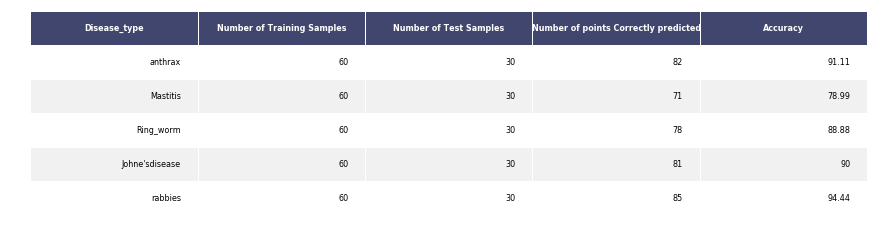

In [373]:
import six

def render_mpl_table(data, col_width=50.0, row_height=0.625, font_size=8,
                     header_color='#40466e', row_colors=['#f1f1f2', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in  six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

k=(render_mpl_table(sv, header_columns=0, col_width=3.0))
mat.savefig('svm_samples_result.jpeg')

## SVM training for existing comparison

In [ ]:
alpha = [10 ** x for x in range(-5, 3)]
cv_log_error_array = []
count=0
for i in alpha:
    print("for C =", i)
    clf = SGDClassifier( alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(final_train_img[:1000].reshape(1000,230*230*3),final_train_y[:1000])
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(final_train_img[:1000].reshape(1000,230*230*3), final_train_y[:1000])
    sig_clf_probs = sig_clf.predict_proba(final_train_img[1000:1170].reshape(170,230*230*3))
    cv_log_error_array.append(log_loss(final_train_y[1000:1170], sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",cv_log_error_array[count]) 
    count=count+1
fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()
print 'the best alpha value is ',alpha[best_alpha]

In [283]:
clf = SGDClassifier( alpha=1, penalty='l2', loss='log', random_state=42)
clf.fit(final_train_img[:1000].reshape(1000,230*230*3),final_train_y[:1000])
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(final_train_img[:1000].reshape(1000,230*230*3), final_train_y[:1000])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False, class_weight=None,
       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
       l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=None,
       n_iter=None, n_iter_no_change=5, n_jobs=None, penalty='l2',
       power_t=0.5, random_state=42, shuffle=True, tol=None,
       validation_fraction=0.1, verbose=0, warm_start=False),
            cv='warn', method='sigmoid')

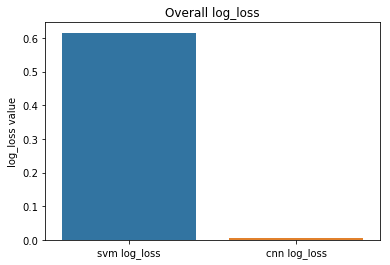

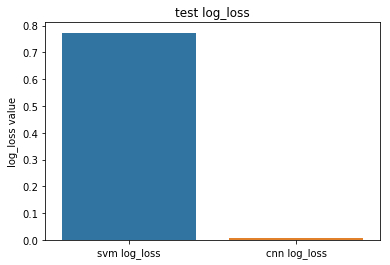

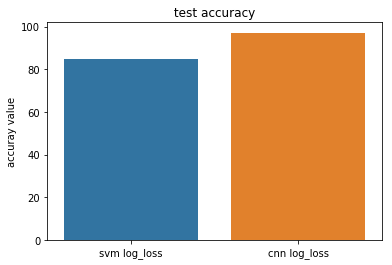

In [28]:
sea.barplot(['svm log_loss','cnn log_loss'],[0.6157,0.0065])
mat.title('Overall log_loss')
mat.ylabel('log_loss value')
mat.show()
sea.barplot(['svm log_loss','cnn log_loss'],[0.7732,0.0069])
mat.title('test log_loss')
mat.ylabel('log_loss value')
mat.show()
sea.barplot(['svm log_loss','cnn log_loss'],[ 84.68,97.06])
sea.barplot(['svm log_loss','cnn log_loss'],[0.7732,0.0069])
mat.title(' test accuracy ')
mat.ylabel('accuray value')
mat.show()
